In [6]:
%matplotlib inline
import numpy as np
from scipy import misc
import numpy as sp
#from scipy import imageio
import matplotlib.pyplot as plt

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until

In [18]:
from skimage import data

photo_data = misc.imread('./wifire/sd-3layers.jpg')
print(type(photo_data))
print(photo_data.shape)

C:\anaconda3\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until


<class 'numpy.ndarray'>
(3725, 4797, 3)


In [19]:
import imageio as imio
photo_data2 = imio.imread('./wifire/sd-3layers.jpg')
print(type(photo_data2))
print(photo_data2.shape)

<class 'imageio.core.util.Array'>
(3725, 4797, 3)


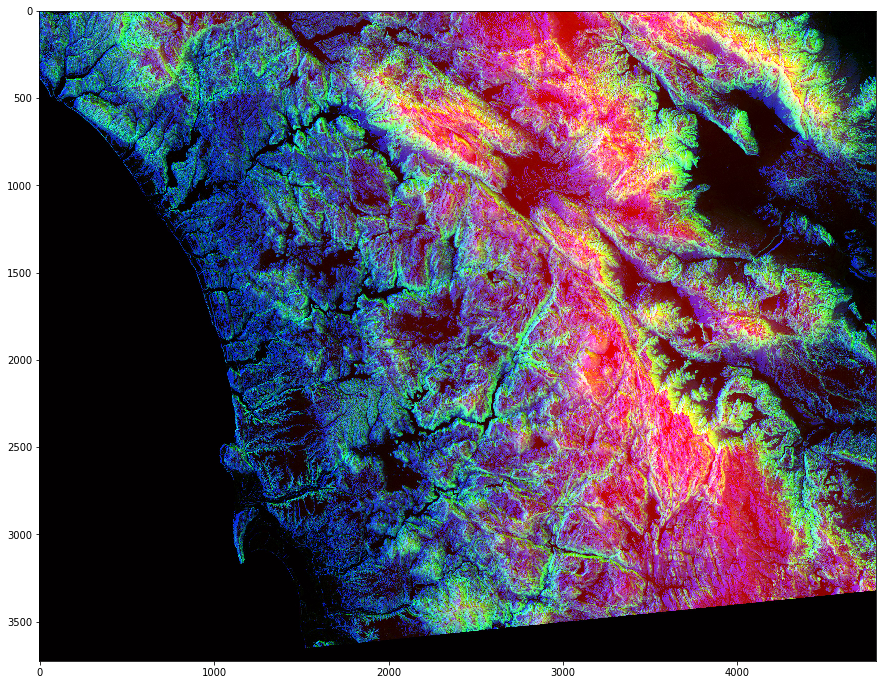

In [20]:
plt.figure(figsize=(15, 15))
plt.imshow(photo_data2)

In [21]:
photo_data.size

53606475

In [22]:
photo_data.min(), photo_data.max()

(0, 255)

In [23]:
photo_data.mean()

75.8299354508947

In [24]:
photo_data[150, 250]

array([ 17,  35, 255], dtype=uint8)

In [25]:
photo_data[150, 250, 1]

35

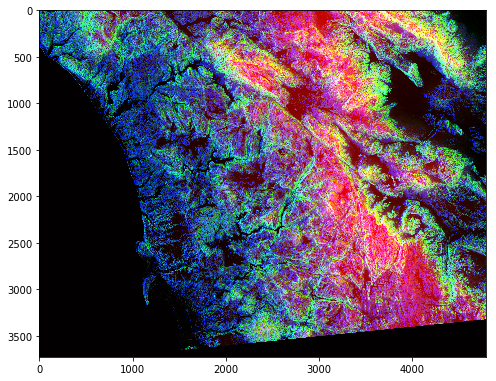

In [29]:
import imageio as imio
photo_data = imio.imread('./wifire/sd-3layers.jpg')
photo_data[150, 250] = 0
plt.figure(figsize=(8, 8))
plt.imshow(photo_data)

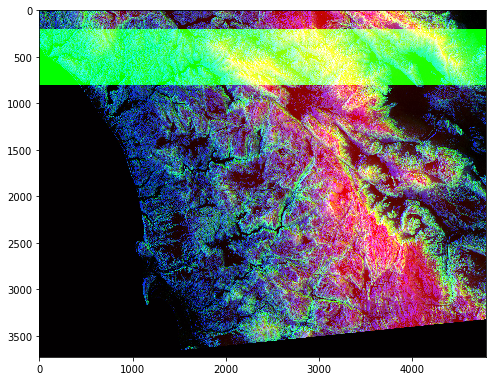

In [30]:
import imageio as imio
photo_data = imio.imread('./wifire/sd-3layers.jpg')
photo_data[200:800, :, 1] = 255
plt.figure(figsize=(8, 8))
plt.imshow(photo_data)

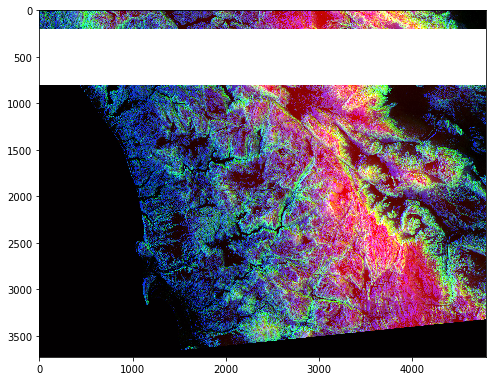

In [31]:
import imageio as imio
photo_data = imio.imread('./wifire/sd-3layers.jpg')
photo_data[200:800, :] = 255
plt.figure(figsize=(8, 8))
plt.imshow(photo_data)

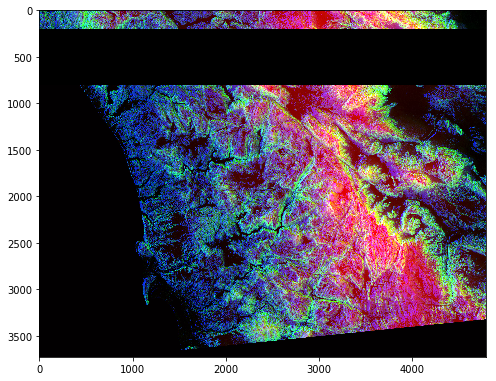

In [32]:
import imageio as imio
photo_data = imio.imread('./wifire/sd-3layers.jpg')
photo_data[200:800, :] = 0
plt.figure(figsize=(8, 8))
plt.imshow(photo_data)

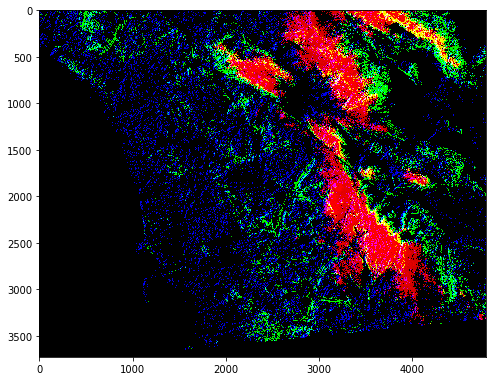

In [39]:

photo_data = imio.imread('./wifire/sd-3layers.jpg')
#print('shape of photo_data', photo_data.shape)
low_value_filter = photo_data < 200
#print('shape of low_value_filter', low_value_filter)
photo_data[low_value_filter] = 0
plt.figure(figsize=(8, 8))
plt.imshow(photo_data)


<class 'numpy.ndarray'> (3725,)


array([   0,    1,    2, ..., 3722, 3723, 3724])

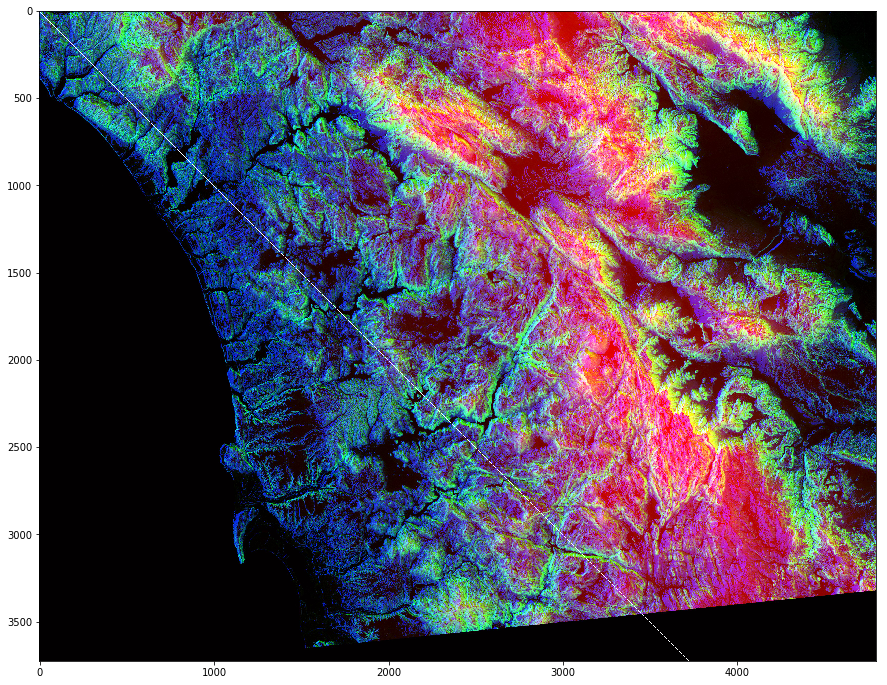

In [51]:
photo_data = imio.imread('./wifire/sd-3layers.jpg')
row_range = np.arange(len(photo_data))
col_range = row_range
print(type(row_range), row_range.shape)
photo_data[row_range, col_range] = 255
plt.figure(figsize=(15, 15))
plt.imshow(photo_data)
col_range

In [56]:
photo_data = imio.imread('./wifire/sd-3layers.jpg')
total_rows, total_cols, total_layers = photo_data.shape
print('shape is ', photo_data.shape)

X, Y = np.ogrid[:total_rows, :total_cols]
print('X shape: ', X.shape, ' Y shape: ', Y.shape, ' X + Y shape: ', (X + Y).shape)

shape is  (3725, 4797, 3)
X shape:  (3725, 1)  Y shape:  (1, 4797)  X + Y shape:  (3725, 4797)


In [60]:
center_row = total_rows/2
center_col = total_cols/2

dist_from_center = (X - center_row)**2 + (Y - center_col)**2
print("dis_from_center shape: ", dist_from_center.shape)
print(dist_from_center)

radius = (total_rows / 2 )**2
print('radius= ', radius)

circular_mask = dis_from_center > radius
print(circular_mask[1500:1700, 2000:2200])

dis_from_center shape:  (3725, 4797)
[[9221708.5 9216912.5 9212118.5 ... 9207326.5 9212118.5 9216912.5]
 [9217984.5 9213188.5 9208394.5 ... 9203602.5 9208394.5 9213188.5]
 [9214262.5 9209466.5 9204672.5 ... 9199880.5 9204672.5 9209466.5]
 ...
 [9210542.5 9205746.5 9200952.5 ... 9196160.5 9200952.5 9205746.5]
 [9214262.5 9209466.5 9204672.5 ... 9199880.5 9204672.5 9209466.5]
 [9217984.5 9213188.5 9208394.5 ... 9203602.5 9208394.5 9213188.5]]
radius=  3468906.25
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


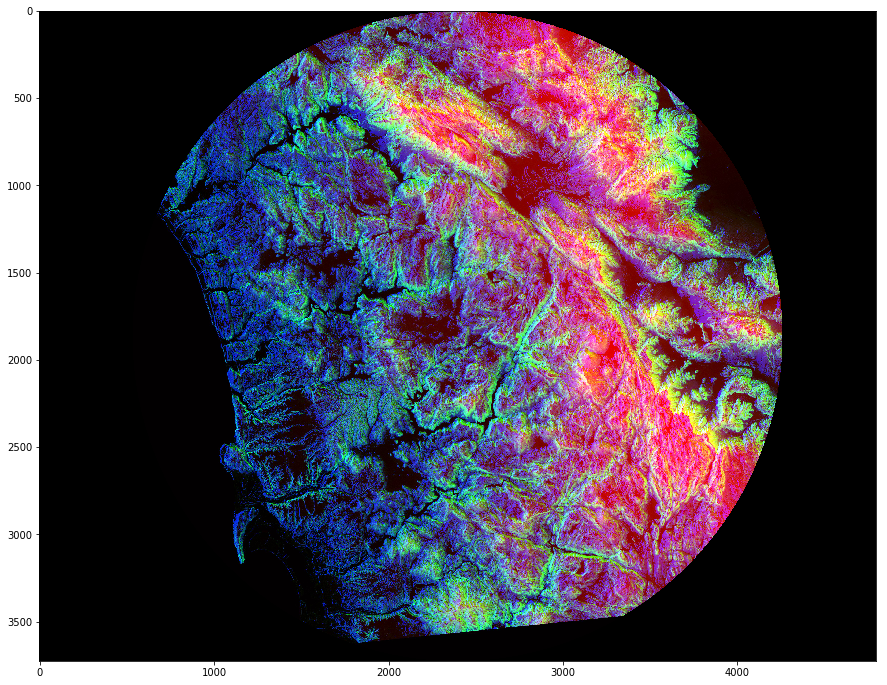

In [61]:
photo_data = imio.imread('./wifire/sd-3layers.jpg')
photo_data[circular_mask] = 0
plt.figure(figsize=(15, 15))
plt.imshow(photo_data)

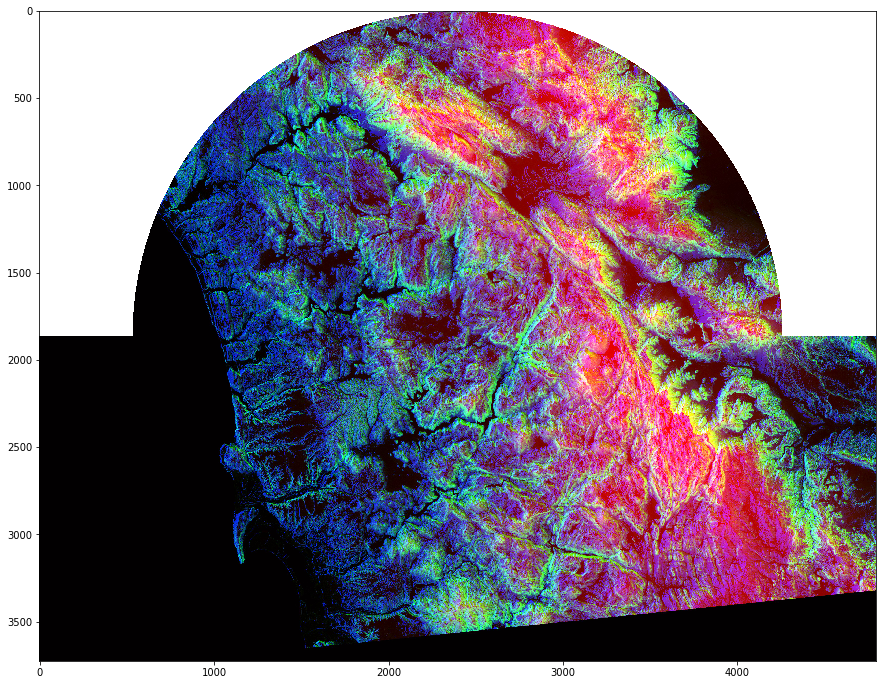

In [62]:
half_upper = X < center_row

half_upper_mask = np.logical_and(circular_mask, half_upper)
photo_data = imio.imread('./wifire/sd-3layers.jpg')

photo_data[half_upper_mask] = 255
plt.figure(figsize=(15, 15))
plt.imshow(photo_data)

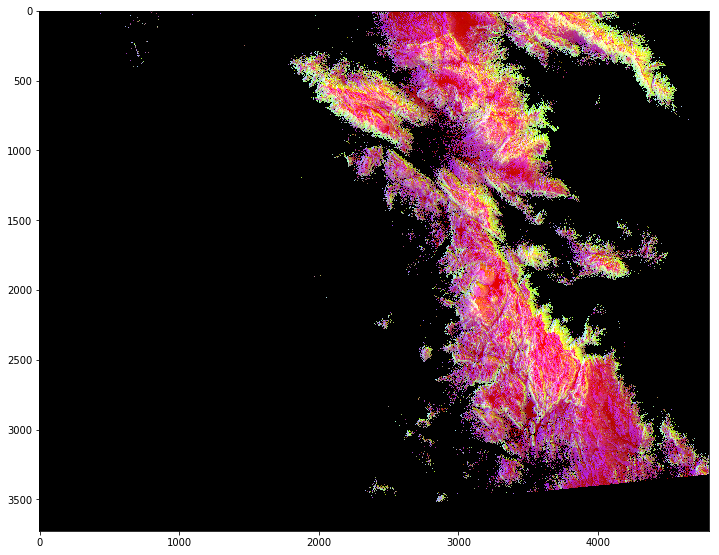

In [65]:
photo_data = imio.imread('./wifire/sd-3layers.jpg')

red_mask = photo_data[:, :, 0] < 150

photo_data[red_mask] = 0
plt.figure(figsize=(12, 12))
plt.imshow(photo_data)

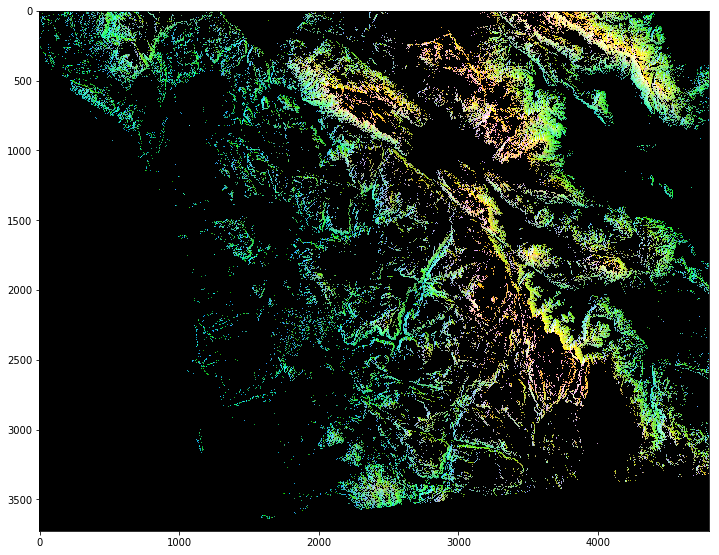

In [66]:
photo_data = imio.imread('./wifire/sd-3layers.jpg')

green_mask = photo_data[:, :, 1] < 150

photo_data[green_mask] = 0
plt.figure(figsize=(12, 12))
plt.imshow(photo_data)

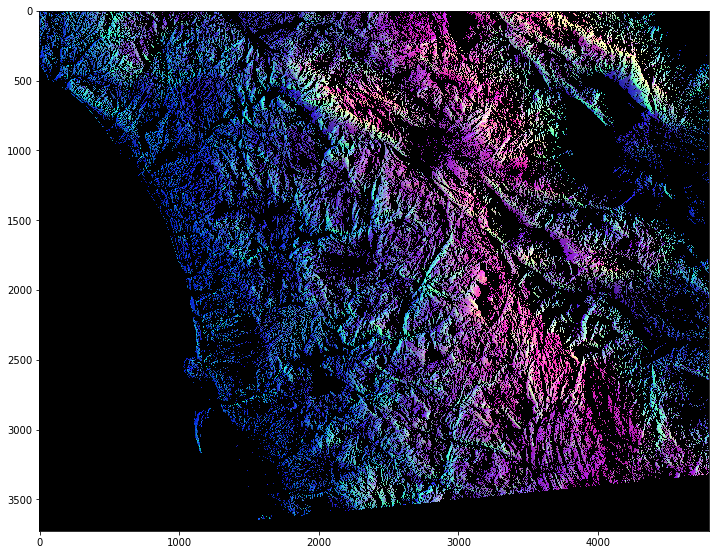

In [67]:
photo_data = imio.imread('./wifire/sd-3layers.jpg')

blue_mask = photo_data[:, :, 2] < 150

photo_data[blue_mask] = 0
plt.figure(figsize=(12, 12))
plt.imshow(photo_data)

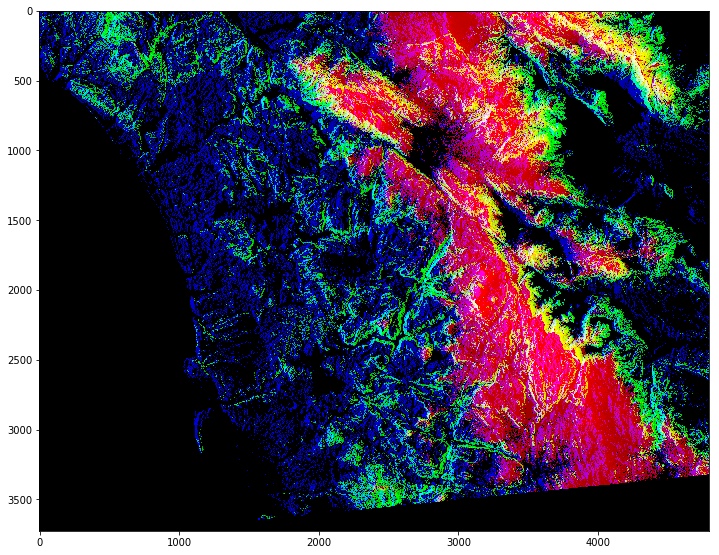

In [68]:
photo_data = imio.imread('./wifire/sd-3layers.jpg')

colour_mask = photo_data[:, :] < 150

photo_data[colour_mask] = 0
plt.figure(figsize=(12, 12))
plt.imshow(photo_data)

(1417, 1102, 3)
[255 255 255 ... 255 255 255]


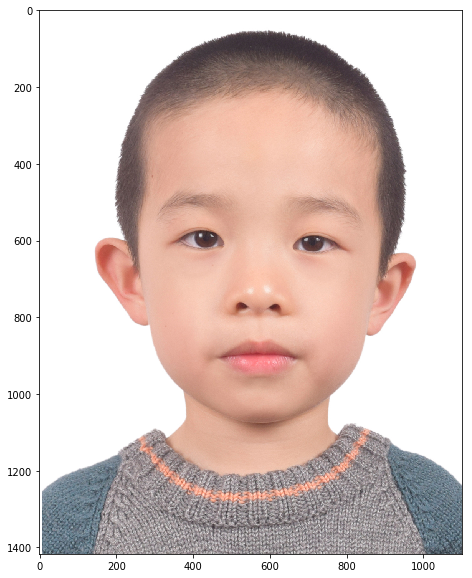

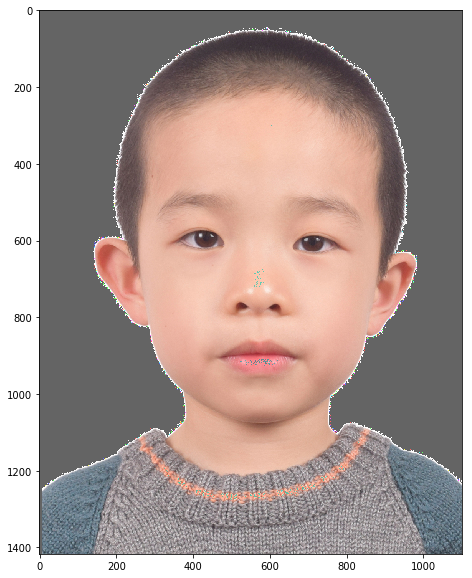

In [96]:
joe_data = imio.imread('./wifire/11.JPG')
plt.figure(figsize=(10, 10))
plt.imshow(joe_data)
back_mask = (joe_data[:, :, : ] == 255)
print(joe_data.shape)
print(joe_data[back_mask])
joe_data[back_mask] = 100
plt.figure(figsize=(10, 10))
plt.imshow(joe_data)

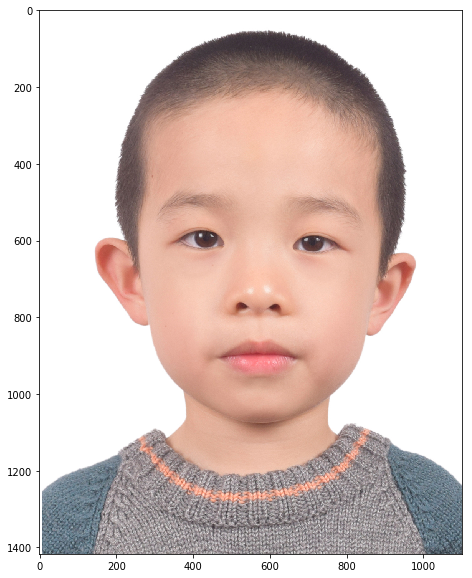

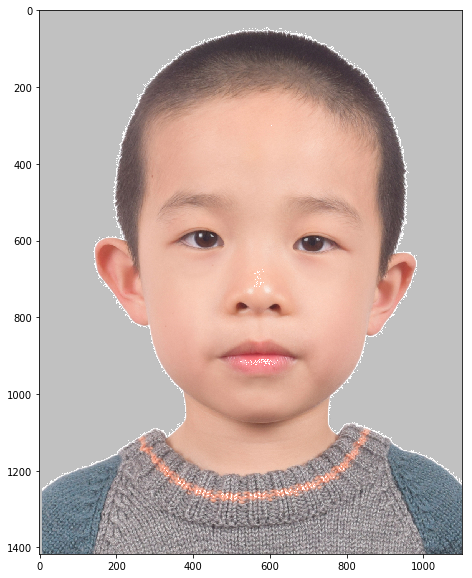

In [101]:
joe_data = imio.imread('./wifire/11.JPG')
plt.figure(figsize=(10, 10))
plt.imshow(joe_data)

red_mask = (joe_data[:, :, 0] == 255)
green_mask = (joe_data[:, :, 1] == 255)
blue_mask = (joe_data[:, :, 2] == 255)

joe_data[red_mask] = 255
joe_data[green_mask] = 182
joe_data[blue_mask] = 193

plt.figure(figsize=(10, 10))
plt.imshow(joe_data)

Array([200, 200, 200], dtype=uint8)